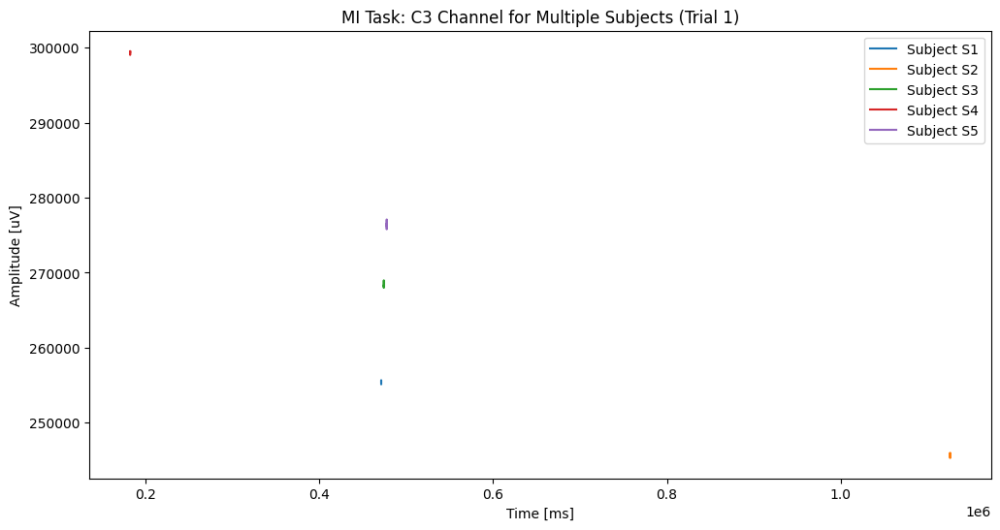

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# --- Config ---
base_path = '/kaggle/input/mtcaic3'
task = 'MI'
dataset = 'train'
subjects = ['S1', 'S2', 'S3', 'S4', 'S5']   # pick a few subjects to compare
session = '1'
channel = 'C3'  # for MI, C3 and C4 are motor cortex

# --- Plot ---
plt.figure(figsize=(12, 6))

for subj in subjects:
    eeg_file = f"{base_path}/{task}/{dataset}/{subj}/{session}/EEGdata.csv"
    eeg_data = pd.read_csv(eeg_file)
    
    # Extract first trial (1-2250 samples for MI)
    samples_per_trial = 2250
    trial_data = eeg_data.iloc[0:samples_per_trial]

    plt.plot(trial_data['Time'], trial_data[channel], label=f'Subject {subj}')

plt.title(f'{task} Task: {channel} Channel for Multiple Subjects (Trial 1)')
plt.xlabel('Time [ms]')
plt.ylabel('Amplitude [uV]')
plt.legend()
plt.show()

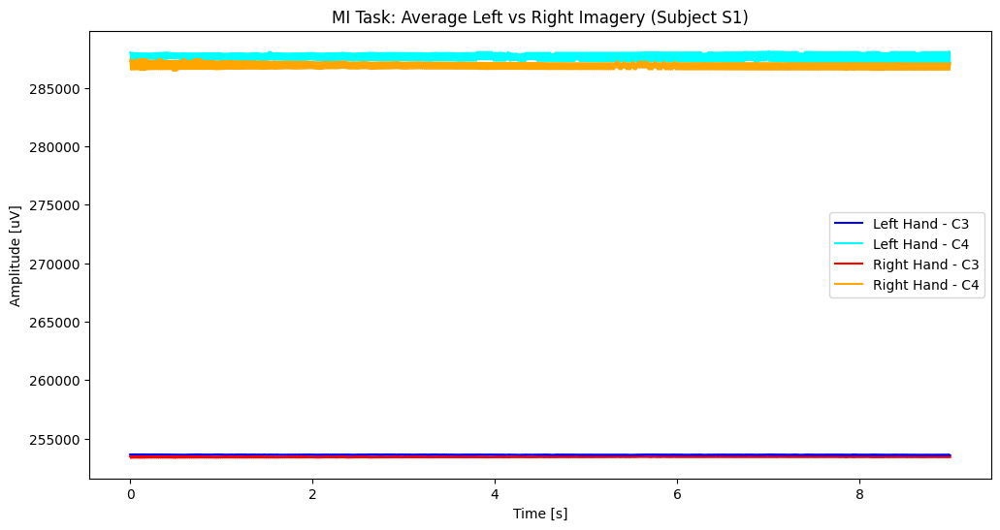

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# --- Config ---
base_path = '/kaggle/input/mtcaic3'
subject = 'S1'
task = 'MI'
dataset = 'train'
sessions = ['1']  # or more sessions
channels = ['C3', 'C4']

# Get train.csv to filter trials by label
train_df = pd.read_csv(os.path.join(base_path, 'train.csv'))

# Filter to this subject & MI
subject_trials = train_df[
    (train_df['subject_id'] == subject) &
    (train_df['task'] == task)
]

# Separate Left and Right trials
left_trials = subject_trials[subject_trials['label'] == 'Left']
right_trials = subject_trials[subject_trials['label'] == 'Right']

# Function to get trial signal
def get_trial_signal(row, channels):
    eeg_file = f"{base_path}/{row['task']}/{dataset}/{row['subject_id']}/{row['trial_session']}/EEGdata.csv"
    eeg_data = pd.read_csv(eeg_file)
    samples_per_trial = 2250  # MI
    idx = int(row['trial']) - 1
    trial_data = eeg_data.iloc[idx*samples_per_trial : (idx+1)*samples_per_trial]
    return trial_data[channels].values

# Average across all Left trials
left_signals = [get_trial_signal(row, channels) for _, row in left_trials.iterrows()]
left_mean = np.mean(left_signals, axis=0)

# Average across all Right trials
right_signals = [get_trial_signal(row, channels) for _, row in right_trials.iterrows()]
right_mean = np.mean(right_signals, axis=0)

# Plot
time = np.arange(left_mean.shape[0]) / 250  # seconds

plt.figure(figsize=(12, 6))
plt.plot(time, left_mean[:, 0], label='Left Hand - C3', color='blue')
plt.plot(time, left_mean[:, 1], label='Left Hand - C4', color='cyan')
plt.plot(time, right_mean[:, 0], label='Right Hand - C3', color='red')
plt.plot(time, right_mean[:, 1], label='Right Hand - C4', color='orange')

plt.title(f'MI Task: Average Left vs Right Imagery (Subject {subject})')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude [uV]')
plt.legend()
plt.show()


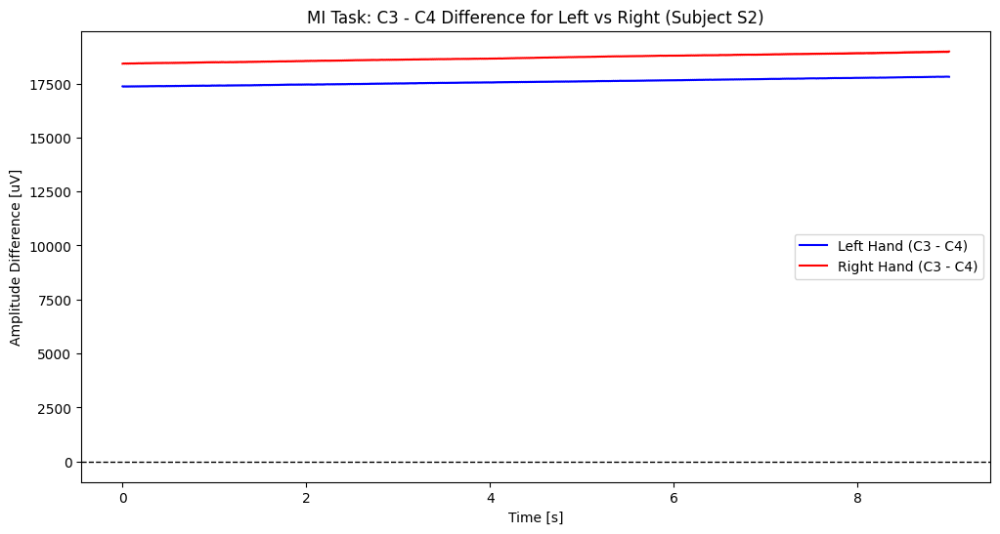

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# --- Config ---
base_path = '/kaggle/input/mtcaic3'
subject = 'S2'
task = 'MI'
dataset = 'train'
sessions = ['1']  # or more sessions
channels = ['C3', 'C4']

# Load train.csv
train_df = pd.read_csv(os.path.join(base_path, 'train.csv'))

# Filter for this subject & MI
subject_trials = train_df[
    (train_df['subject_id'] == subject) &
    (train_df['task'] == task)
]

# Separate Left and Right trials
left_trials = subject_trials[subject_trials['label'] == 'Left']
right_trials = subject_trials[subject_trials['label'] == 'Right']

# Function to load trial EEG segment
def get_trial_signal(row, channels):
    eeg_file = f"{base_path}/{row['task']}/{dataset}/{row['subject_id']}/{row['trial_session']}/EEGdata.csv"
    eeg_data = pd.read_csv(eeg_file)
    samples_per_trial = 2250  # MI task
    idx = int(row['trial']) - 1
    trial_data = eeg_data.iloc[idx*samples_per_trial : (idx+1)*samples_per_trial]
    return trial_data[channels].values

# Collect and average Left trials
left_signals = [get_trial_signal(row, channels) for _, row in left_trials.iterrows()]
left_mean = np.mean(left_signals, axis=0)

# Collect and average Right trials
right_signals = [get_trial_signal(row, channels) for _, row in right_trials.iterrows()]
right_mean = np.mean(right_signals, axis=0)

# Compute C3 - C4 for Left and Right
left_diff = left_mean[:, 0] - left_mean[:, 1]   # C3 - C4 for Left
right_diff = right_mean[:, 0] - right_mean[:, 1]  # C3 - C4 for Right

# Time vector
time = np.arange(left_mean.shape[0]) / 250  # seconds

# --- Plot ---
plt.figure(figsize=(12, 6))
plt.plot(time, left_diff, label='Left Hand (C3 - C4)', color='blue')
plt.plot(time, right_diff, label='Right Hand (C3 - C4)', color='red')

plt.title(f'MI Task: C3 - C4 Difference for Left vs Right (Subject {subject})')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude Difference [uV]')
plt.axhline(0, color='black', linestyle='--', linewidth=1)
plt.legend()
plt.show()


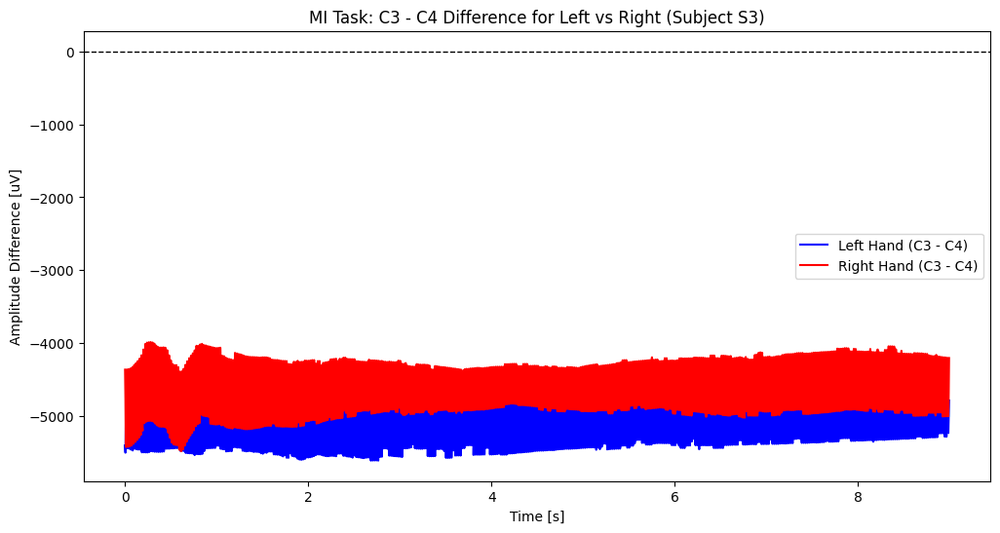

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# --- Config ---
base_path = '/kaggle/input/mtcaic3'
subject = 'S3'
task = 'MI'
dataset = 'train'
sessions = ['1']  # or more sessions
channels = ['C3', 'C4']

# Load train.csv
train_df = pd.read_csv(os.path.join(base_path, 'train.csv'))

# Filter for this subject & MI
subject_trials = train_df[
    (train_df['subject_id'] == subject) &
    (train_df['task'] == task)
]

# Separate Left and Right trials
left_trials = subject_trials[subject_trials['label'] == 'Left']
right_trials = subject_trials[subject_trials['label'] == 'Right']

# Function to load trial EEG segment
def get_trial_signal(row, channels):
    eeg_file = f"{base_path}/{row['task']}/{dataset}/{row['subject_id']}/{row['trial_session']}/EEGdata.csv"
    eeg_data = pd.read_csv(eeg_file)
    samples_per_trial = 2250  # MI task
    idx = int(row['trial']) - 1
    trial_data = eeg_data.iloc[idx*samples_per_trial : (idx+1)*samples_per_trial]
    return trial_data[channels].values

# Collect and average Left trials
left_signals = [get_trial_signal(row, channels) for _, row in left_trials.iterrows()]
left_mean = np.mean(left_signals, axis=0)

# Collect and average Right trials
right_signals = [get_trial_signal(row, channels) for _, row in right_trials.iterrows()]
right_mean = np.mean(right_signals, axis=0)

# Compute C3 - C4 for Left and Right
left_diff = left_mean[:, 0] - left_mean[:, 1]   # C3 - C4 for Left
right_diff = right_mean[:, 0] - right_mean[:, 1]  # C3 - C4 for Right

# Time vector
time = np.arange(left_mean.shape[0]) / 250  # seconds

# --- Plot ---
plt.figure(figsize=(12, 6))
plt.plot(time, left_diff, label='Left Hand (C3 - C4)', color='blue')
plt.plot(time, right_diff, label='Right Hand (C3 - C4)', color='red')

plt.title(f'MI Task: C3 - C4 Difference for Left vs Right (Subject {subject})')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude Difference [uV]')
plt.axhline(0, color='black', linestyle='--', linewidth=1)
plt.legend()
plt.show()


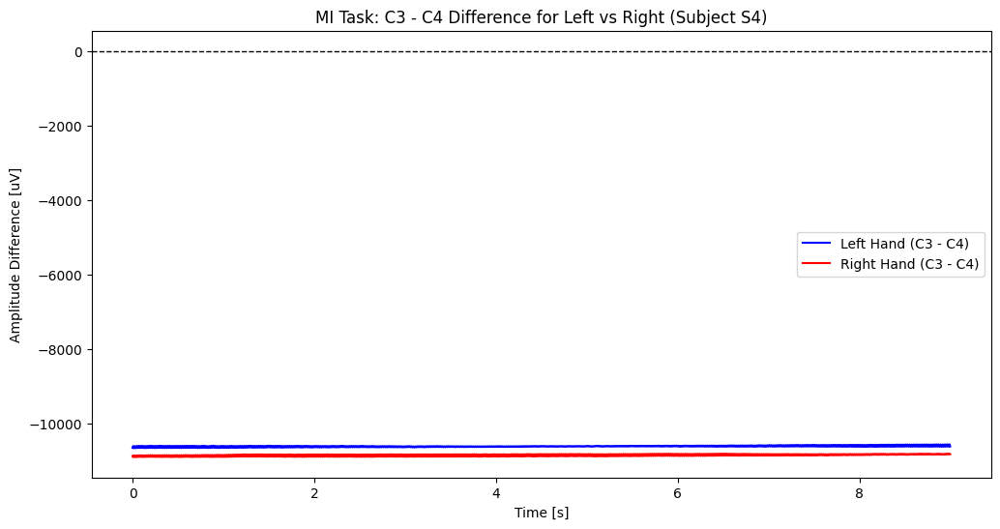

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# --- Config ---
base_path = '/kaggle/input/mtcaic3'
subject = 'S4'
task = 'MI'
dataset = 'train'
sessions = ['1']  # or more sessions
channels = ['C3', 'C4']

# Load train.csv
train_df = pd.read_csv(os.path.join(base_path, 'train.csv'))

# Filter for this subject & MI
subject_trials = train_df[
    (train_df['subject_id'] == subject) &
    (train_df['task'] == task)
]

# Separate Left and Right trials
left_trials = subject_trials[subject_trials['label'] == 'Left']
right_trials = subject_trials[subject_trials['label'] == 'Right']

# Function to load trial EEG segment
def get_trial_signal(row, channels):
    eeg_file = f"{base_path}/{row['task']}/{dataset}/{row['subject_id']}/{row['trial_session']}/EEGdata.csv"
    eeg_data = pd.read_csv(eeg_file)
    samples_per_trial = 2250  # MI task
    idx = int(row['trial']) - 1
    trial_data = eeg_data.iloc[idx*samples_per_trial : (idx+1)*samples_per_trial]
    return trial_data[channels].values

# Collect and average Left trials
left_signals = [get_trial_signal(row, channels) for _, row in left_trials.iterrows()]
left_mean = np.mean(left_signals, axis=0)

# Collect and average Right trials
right_signals = [get_trial_signal(row, channels) for _, row in right_trials.iterrows()]
right_mean = np.mean(right_signals, axis=0)

# Compute C3 - C4 for Left and Right
left_diff = left_mean[:, 0] - left_mean[:, 1]   # C3 - C4 for Left
right_diff = right_mean[:, 0] - right_mean[:, 1]  # C3 - C4 for Right

# Time vector
time = np.arange(left_mean.shape[0]) / 250  # seconds

# --- Plot ---
plt.figure(figsize=(12, 6))
plt.plot(time, left_diff, label='Left Hand (C3 - C4)', color='blue')
plt.plot(time, right_diff, label='Right Hand (C3 - C4)', color='red')

plt.title(f'MI Task: C3 - C4 Difference for Left vs Right (Subject {subject})')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude Difference [uV]')
plt.axhline(0, color='black', linestyle='--', linewidth=1)
plt.legend()
plt.show()


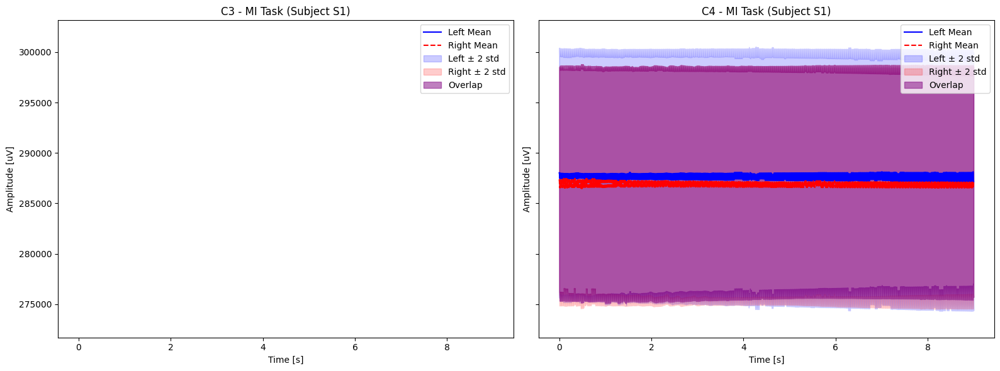

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# --- Config ---
base_path = '/kaggle/input/mtcaic3'
subject = 'S1'
task = 'MI'
dataset = 'train'
channels = ['C3', 'C4']

train_df = pd.read_csv(os.path.join(base_path, 'train.csv'))

subject_trials = train_df[
    (train_df['subject_id'] == subject) &
    (train_df['task'] == task)
]

left_trials = subject_trials[subject_trials['label'] == 'Left']
right_trials = subject_trials[subject_trials['label'] == 'Right']

def get_trial_signal(row, channels):
    eeg_file = f"{base_path}/{row['task']}/{dataset}/{row['subject_id']}/{row['trial_session']}/EEGdata.csv"
    eeg_data = pd.read_csv(eeg_file)
    samples_per_trial = 2250
    idx = int(row['trial']) - 1
    trial_data = eeg_data.iloc[idx*samples_per_trial : (idx+1)*samples_per_trial]
    return trial_data[channels].values

left_signals = [get_trial_signal(row, channels) for _, row in left_trials.iterrows()]
right_signals = [get_trial_signal(row, channels) for _, row in right_trials.iterrows()]

left_signals = np.array(left_signals)
right_signals = np.array(right_signals)

left_mean = np.mean(left_signals, axis=0)
left_std = np.std(left_signals, axis=0)
right_mean = np.mean(right_signals, axis=0)
right_std = np.std(right_signals, axis=0)

time = np.arange(left_mean.shape[0]) / 250

factor = 2  # wider bands

# Plot both channels side by side
fig, axs = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

for i, ch in enumerate(channels):
    ax = axs[i]

    left_upper = left_mean[:, i] + factor * left_std[:, i]
    left_lower = left_mean[:, i] - factor * left_std[:, i]
    right_upper = right_mean[:, i] + factor * right_std[:, i]
    right_lower = right_mean[:, i] - factor * right_std[:, i]

    ax.plot(time, left_mean[:, i], label=f'Left Mean', color='blue', linestyle='-')
    ax.plot(time, right_mean[:, i], label=f'Right Mean', color='red', linestyle='--')

    ax.fill_between(time, left_lower, left_upper, color='blue', alpha=0.2, label='Left ± 2 std')
    ax.fill_between(time, right_lower, right_upper, color='red', alpha=0.2, label='Right ± 2 std')

    # Overlap
    overlap_lower = np.maximum(left_lower, right_lower)
    overlap_upper = np.minimum(left_upper, right_upper)
    overlap = overlap_upper > overlap_lower
    ax.fill_between(time, overlap_lower, overlap_upper, where=overlap,
                    color='purple', alpha=0.5, label='Overlap')

    # Y-axis: expand
    y_min = min(left_lower.min(), right_lower.min())
    y_max = max(left_upper.max(), right_upper.max())
    y_range = y_max - y_min
    ax.set_ylim(y_min - 0.1 * y_range, y_max + 0.1 * y_range)

    ax.set_title(f'{ch} - {task} Task (Subject {subject})')
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Amplitude [uV]')
    ax.axhline(0, color='black', linestyle='--', linewidth=0.8)
    ax.legend()

plt.tight_layout()
plt.show()


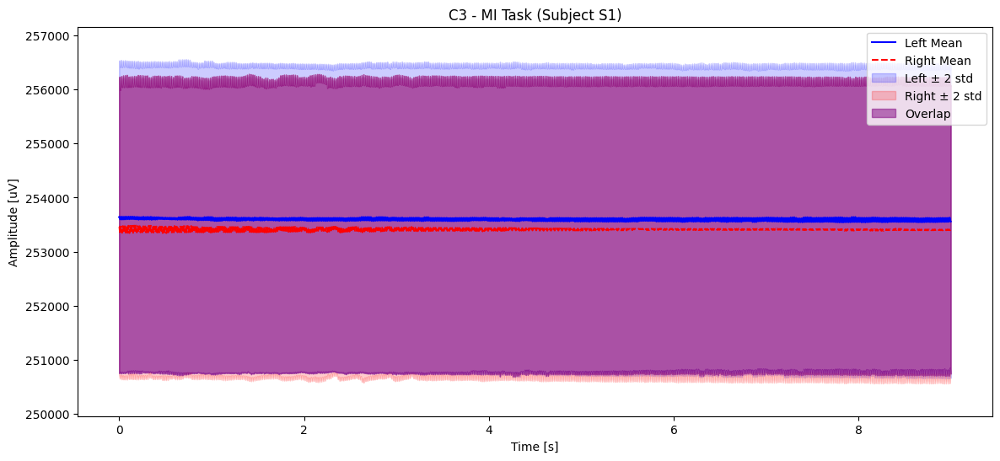

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# --- Config ---
base_path = '/kaggle/input/mtcaic3'
subject = 'S1'
task = 'MI'
dataset = 'train'
channel = 'C3'  # <<<<<< Only C3

train_df = pd.read_csv(os.path.join(base_path, 'train.csv'))

subject_trials = train_df[
    (train_df['subject_id'] == subject) &
    (train_df['task'] == task)
]

left_trials = subject_trials[subject_trials['label'] == 'Left']
right_trials = subject_trials[subject_trials['label'] == 'Right']

def get_trial_signal(row, channel):
    eeg_file = f"{base_path}/{row['task']}/{dataset}/{row['subject_id']}/{row['trial_session']}/EEGdata.csv"
    eeg_data = pd.read_csv(eeg_file)
    samples_per_trial = 2250
    idx = int(row['trial']) - 1
    trial_data = eeg_data.iloc[idx*samples_per_trial : (idx+1)*samples_per_trial]
    return trial_data[[channel]].values.squeeze()

left_signals = [get_trial_signal(row, channel) for _, row in left_trials.iterrows()]
right_signals = [get_trial_signal(row, channel) for _, row in right_trials.iterrows()]

left_signals = np.stack(left_signals)
right_signals = np.stack(right_signals)

left_mean = np.mean(left_signals, axis=0)
left_std = np.std(left_signals, axis=0)
right_mean = np.mean(right_signals, axis=0)
right_std = np.std(right_signals, axis=0)

time = np.arange(left_mean.shape[0]) / 250
factor = 2

left_upper = left_mean + factor * left_std
left_lower = left_mean - factor * left_std
right_upper = right_mean + factor * right_std
right_lower = right_mean - factor * right_std

plt.figure(figsize=(14, 6))

plt.plot(time, left_mean, label='Left Mean', color='blue')
plt.plot(time, right_mean, label='Right Mean', color='red', linestyle='--')

plt.fill_between(time, left_lower, left_upper, color='blue', alpha=0.2, label='Left ± 2 std')
plt.fill_between(time, right_lower, right_upper, color='red', alpha=0.2, label='Right ± 2 std')

overlap_lower = np.maximum(left_lower, right_lower)
overlap_upper = np.minimum(left_upper, right_upper)
overlap = overlap_upper > overlap_lower
plt.fill_between(time, overlap_lower, overlap_upper, where=overlap, color='purple', alpha=0.5, label='Overlap')

# Better Y axis for C3
y_min = min(left_lower.min(), right_lower.min())
y_max = max(left_upper.max(), right_upper.max())
y_range = y_max - y_min
plt.ylim(y_min - 0.1 * y_range, y_max + 0.1 * y_range)

plt.title(f'{channel} - {task} Task (Subject {subject})')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude [uV]')
plt.axhline(0, color='black', linestyle='--', linewidth=0.8)
plt.legend()
plt.show()


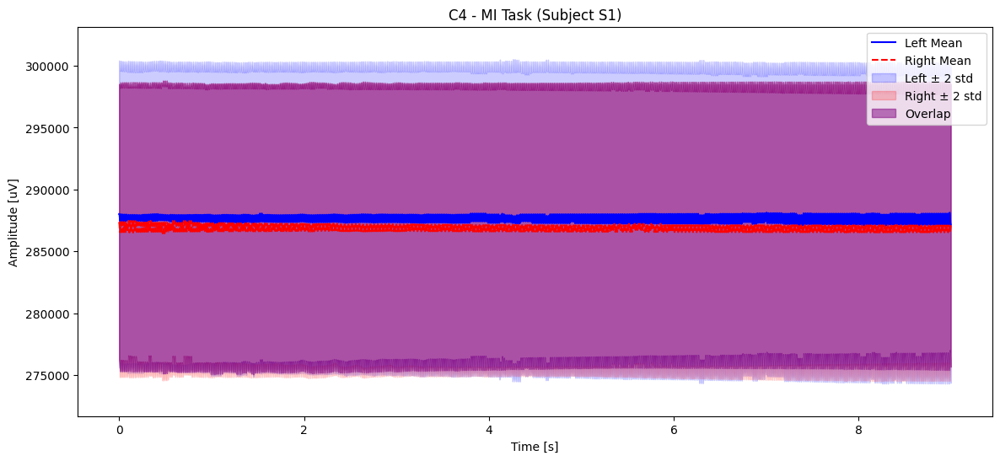

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# --- Config ---
base_path = '/kaggle/input/mtcaic3'
subject = 'S1'
task = 'MI'
dataset = 'train'
channel = 'C4'  # <<<<<< Only C4

train_df = pd.read_csv(os.path.join(base_path, 'train.csv'))

subject_trials = train_df[
    (train_df['subject_id'] == subject) &
    (train_df['task'] == task)
]

left_trials = subject_trials[subject_trials['label'] == 'Left']
right_trials = subject_trials[subject_trials['label'] == 'Right']

def get_trial_signal(row, channel):
    eeg_file = f"{base_path}/{row['task']}/{dataset}/{row['subject_id']}/{row['trial_session']}/EEGdata.csv"
    eeg_data = pd.read_csv(eeg_file)
    samples_per_trial = 2250
    idx = int(row['trial']) - 1
    trial_data = eeg_data.iloc[idx*samples_per_trial : (idx+1)*samples_per_trial]
    return trial_data[[channel]].values.squeeze()

left_signals = [get_trial_signal(row, channel) for _, row in left_trials.iterrows()]
right_signals = [get_trial_signal(row, channel) for _, row in right_trials.iterrows()]

left_signals = np.stack(left_signals)
right_signals = np.stack(right_signals)

left_mean = np.mean(left_signals, axis=0)
left_std = np.std(left_signals, axis=0)
right_mean = np.mean(right_signals, axis=0)
right_std = np.std(right_signals, axis=0)

time = np.arange(left_mean.shape[0]) / 250
factor = 2

left_upper = left_mean + factor * left_std
left_lower = left_mean - factor * left_std
right_upper = right_mean + factor * right_std
right_lower = right_mean - factor * right_std

plt.figure(figsize=(14, 6))

plt.plot(time, left_mean, label='Left Mean', color='blue')
plt.plot(time, right_mean, label='Right Mean', color='red', linestyle='--')

plt.fill_between(time, left_lower, left_upper, color='blue', alpha=0.2, label='Left ± 2 std')
plt.fill_between(time, right_lower, right_upper, color='red', alpha=0.2, label='Right ± 2 std')

overlap_lower = np.maximum(left_lower, right_lower)
overlap_upper = np.minimum(left_upper, right_upper)
overlap = overlap_upper > overlap_lower
plt.fill_between(time, overlap_lower, overlap_upper, where=overlap, color='purple', alpha=0.5, label='Overlap')

# Better Y axis for C4
y_min = min(left_lower.min(), right_lower.min())
y_max = max(left_upper.max(), right_upper.max())
y_range = y_max - y_min
plt.ylim(y_min - 0.1 * y_range, y_max + 0.1 * y_range)

plt.title(f'{channel} - {task} Task (Subject {subject})')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude [uV]')
plt.axhline(0, color='black', linestyle='--', linewidth=0.8)
plt.legend()
plt.show()


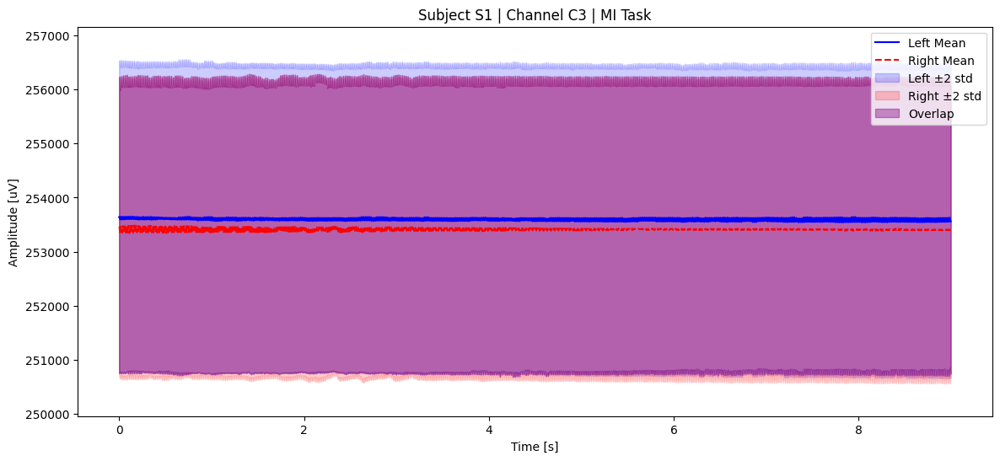

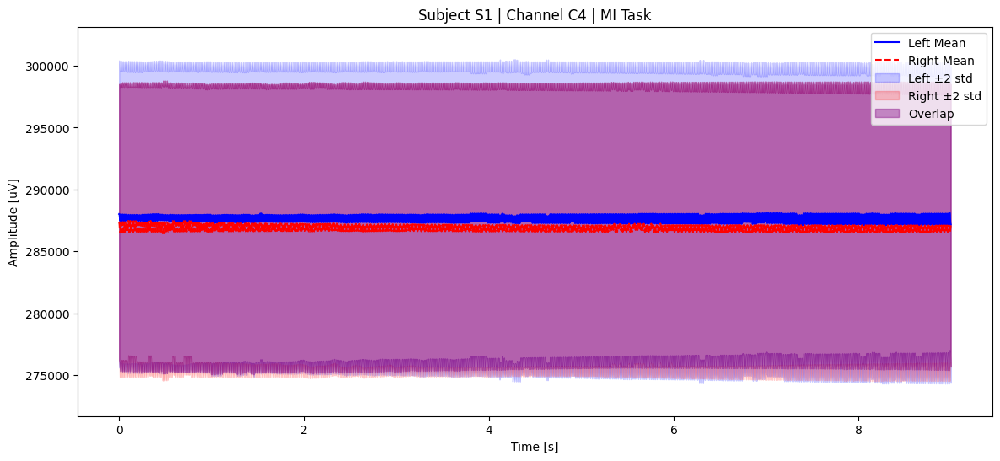

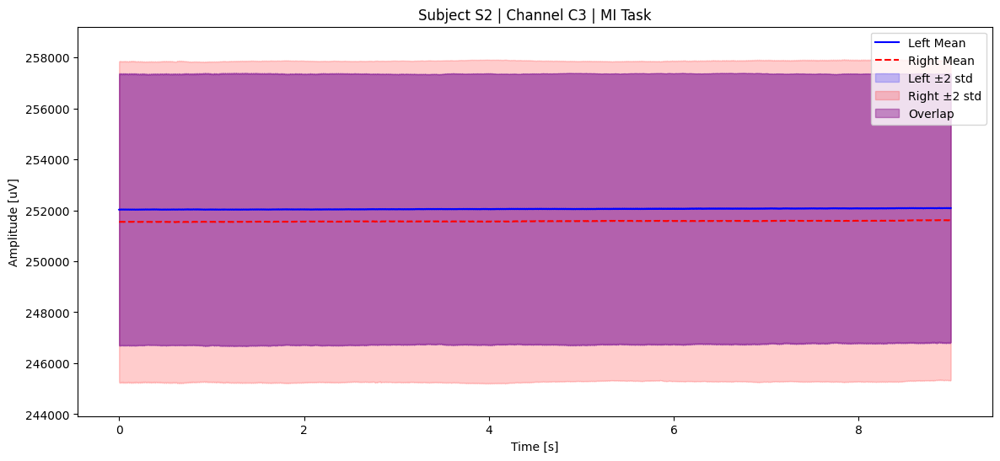

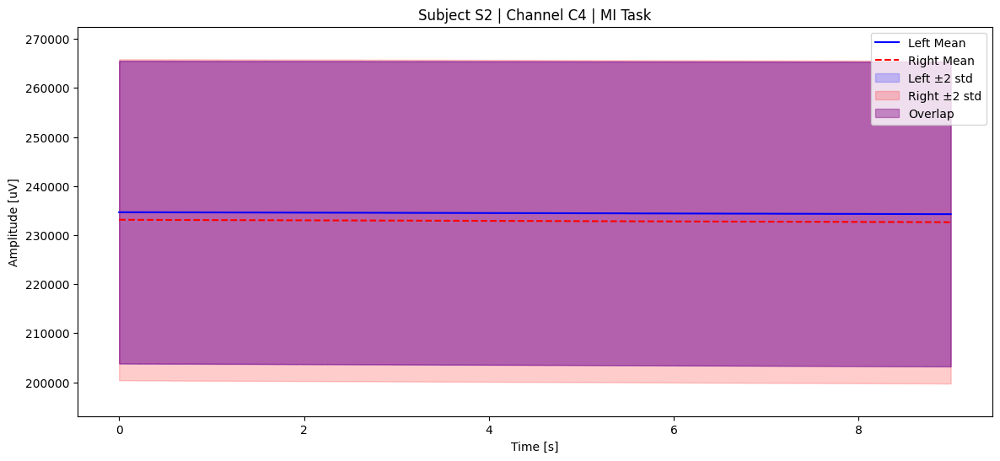

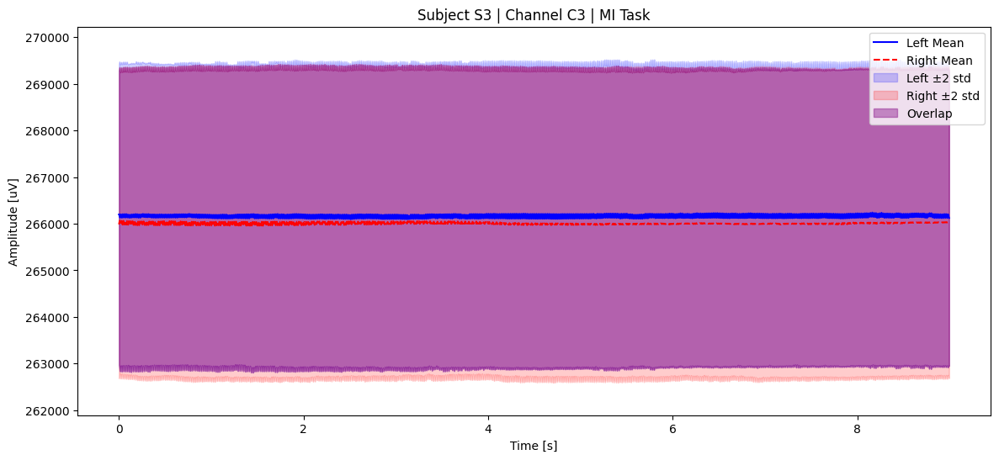

...

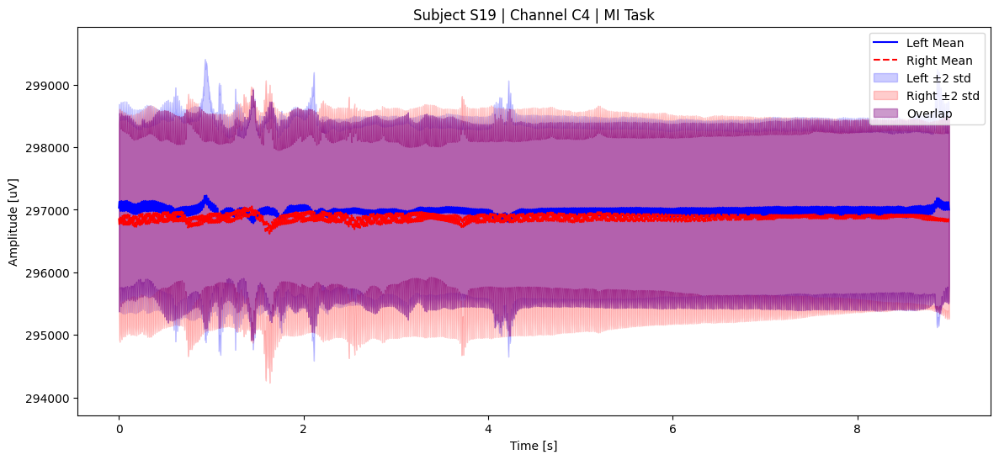

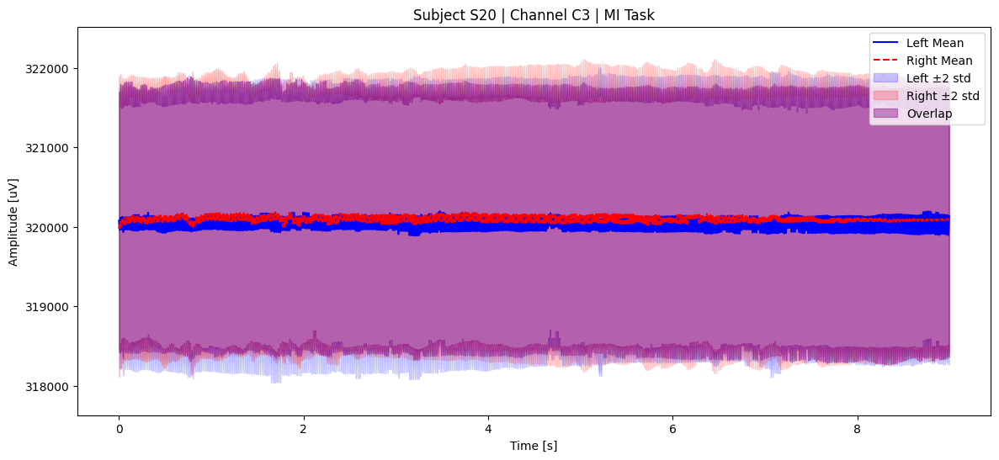

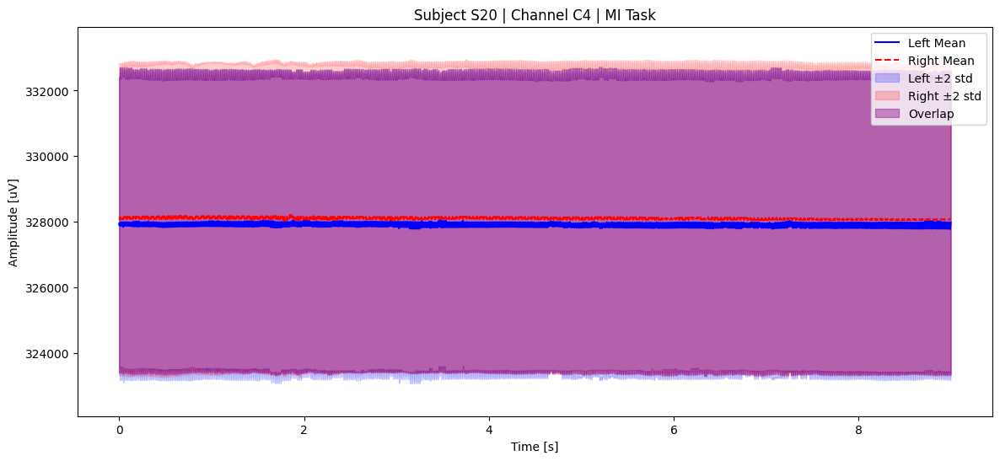

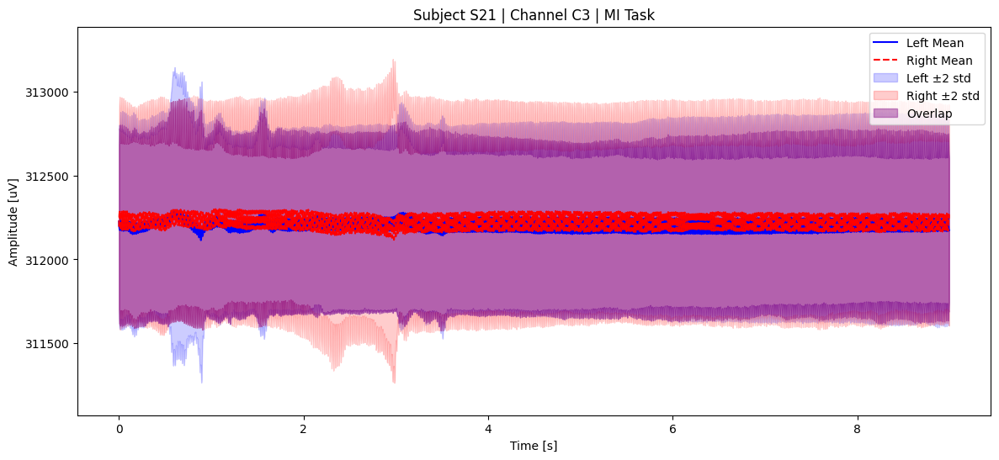

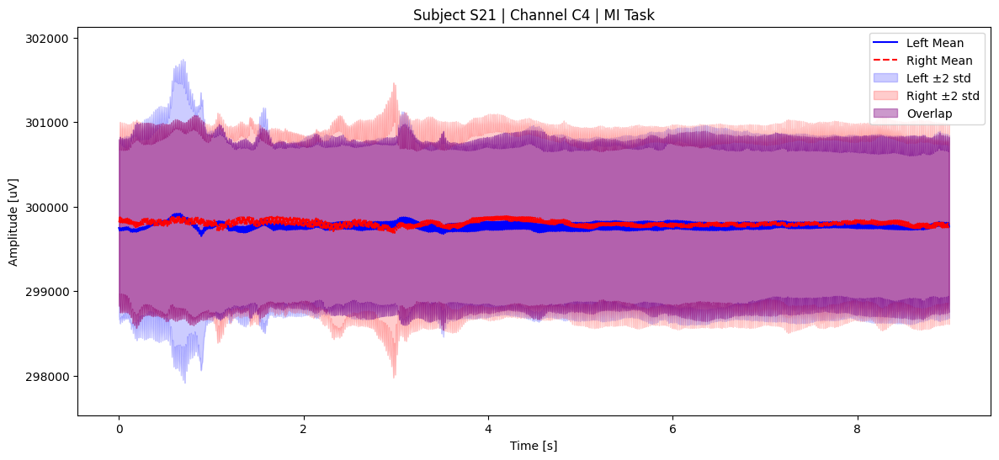

ParserError: Error tokenizing data. C error: Calling read(nbytes) on source failed. Try engine='python'.

In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# --- Config ---
base_path = '/kaggle/input/mtcaic3'
task = 'MI'
dataset = 'train'
channels = ['C3', 'C4']

# Load metadata
train_df = pd.read_csv(os.path.join(base_path, 'train.csv'))
subjects = train_df['subject_id'].unique()

# Function to extract signal for a single channel
def get_trial_signal(row, channel):
    eeg_file = f"{base_path}/{row['task']}/{dataset}/{row['subject_id']}/{row['trial_session']}/EEGdata.csv"
    eeg_data = pd.read_csv(eeg_file)
    samples_per_trial = 2250  # MI
    idx = int(row['trial']) - 1
    trial_data = eeg_data.iloc[idx*samples_per_trial : (idx+1)*samples_per_trial]
    return trial_data[[channel]].values.squeeze()

# Function to plot one subject & channel
def plot_subject_channel(subject, channel):
    # Filter for this subject & MI task
    subject_trials = train_df[
        (train_df['subject_id'] == subject) &
        (train_df['task'] == task)
    ]
    left_trials = subject_trials[subject_trials['label'] == 'Left']
    right_trials = subject_trials[subject_trials['label'] == 'Right']

    # Extract signals
    left_signals = [get_trial_signal(row, channel) for _, row in left_trials.iterrows()]
    right_signals = [get_trial_signal(row, channel) for _, row in right_trials.iterrows()]

    left_signals = np.stack(left_signals)
    right_signals = np.stack(right_signals)

    left_mean = np.mean(left_signals, axis=0)
    left_std = np.std(left_signals, axis=0)
    right_mean = np.mean(right_signals, axis=0)
    right_std = np.std(right_signals, axis=0)

    time = np.arange(left_mean.shape[0]) / 250  # seconds
    factor = 2

    left_upper = left_mean + factor * left_std
    left_lower = left_mean - factor * left_std
    right_upper = right_mean + factor * right_std
    right_lower = right_mean - factor * right_std

    overlap_lower = np.maximum(left_lower, right_lower)
    overlap_upper = np.minimum(left_upper, right_upper)
    overlap = overlap_upper > overlap_lower

    # Plot
    plt.figure(figsize=(14, 6))
    plt.plot(time, left_mean, label='Left Mean', color='blue')
    plt.plot(time, right_mean, label='Right Mean', color='red', linestyle='--')

    plt.fill_between(time, left_lower, left_upper, color='blue', alpha=0.2, label='Left ±2 std')
    plt.fill_between(time, right_lower, right_upper, color='red', alpha=0.2, label='Right ±2 std')
    plt.fill_between(time, overlap_lower, overlap_upper, where=overlap, color='purple', alpha=0.4, label='Overlap')

    # Adjust Y limits nicely
    y_min = min(left_lower.min(), right_lower.min())
    y_max = max(left_upper.max(), right_upper.max())
    y_range = y_max - y_min
    plt.ylim(y_min - 0.1 * y_range, y_max + 0.1 * y_range)

    plt.title(f'Subject {subject} | Channel {channel} | {task} Task')
    plt.xlabel('Time [s]')
    plt.ylabel('Amplitude [uV]')
    plt.axhline(0, color='black', linestyle='--', linewidth=0.8)
    plt.legend()
    plt.show()

# --- Main: loop over subjects & channels ---
for subject in subjects:
    for channel in channels:
        plot_subject_channel(subject, channel)


/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


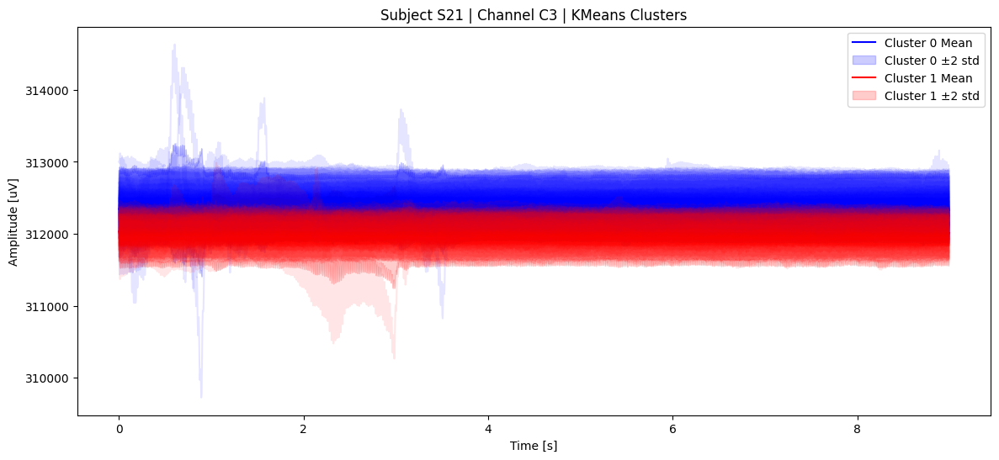

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.cluster import KMeans

# --- Config ---
base_path = '/kaggle/input/mtcaic3'
task = 'MI'
dataset = 'train'
channel = 'C3'  # or 'C4'
subject = 'S21'  # example
n_clusters = 2  # or more

# Load metadata
train_df = pd.read_csv(os.path.join(base_path, 'train.csv'))
subject_trials = train_df[
    (train_df['subject_id'] == subject) &
    (train_df['task'] == task)
]

# Get all signals for this subject & channel
def get_trial_signal(row, channel):
    eeg_file = f"{base_path}/{row['task']}/{dataset}/{row['subject_id']}/{row['trial_session']}/EEGdata.csv"
    eeg_data = pd.read_csv(eeg_file)
    samples_per_trial = 2250
    idx = int(row['trial']) - 1
    trial_data = eeg_data.iloc[idx*samples_per_trial : (idx+1)*samples_per_trial]
    return trial_data[[channel]].values.squeeze()

signals = [get_trial_signal(row, channel) for _, row in subject_trials.iterrows()]
signals = np.stack(signals)  # shape: (num_trials, num_samples)

# --- Clustering ---
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(signals)

# --- Plot ---
time = np.arange(signals.shape[1]) / 250  # seconds

plt.figure(figsize=(14, 6))

colors = ['blue', 'red', 'green', 'orange', 'purple']
for cluster_id in range(n_clusters):
    cluster_signals = signals[cluster_labels == cluster_id]
    mean_signal = np.mean(cluster_signals, axis=0)
    std_signal = np.std(cluster_signals, axis=0)

    upper = mean_signal + 2 * std_signal
    lower = mean_signal - 2 * std_signal

    plt.plot(time, mean_signal, label=f'Cluster {cluster_id} Mean', color=colors[cluster_id])
    plt.fill_between(time, lower, upper, color=colors[cluster_id], alpha=0.2, label=f'Cluster {cluster_id} ±2 std')

# Optionally plot all signals with cluster color
for idx, signal in enumerate(signals):
    plt.plot(time, signal, color=colors[cluster_labels[idx]], alpha=0.1)

plt.title(f'Subject {subject} | Channel {channel} | KMeans Clusters')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude [uV]')
plt.legend()
plt.show()


Subjects found: ['S1' 'S2' 'S3' 'S4' 'S5' 'S6' 'S7' 'S8' 'S9' 'S10' 'S11' 'S12' 'S13'
 'S14' 'S15' 'S16' 'S17' 'S18' 'S19' 'S20' 'S21' 'S22' 'S23' 'S24' 'S25'
 'S26' 'S27' 'S28' 'S29' 'S30']
Collected 2400 trials, each with 2250 samples.


/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


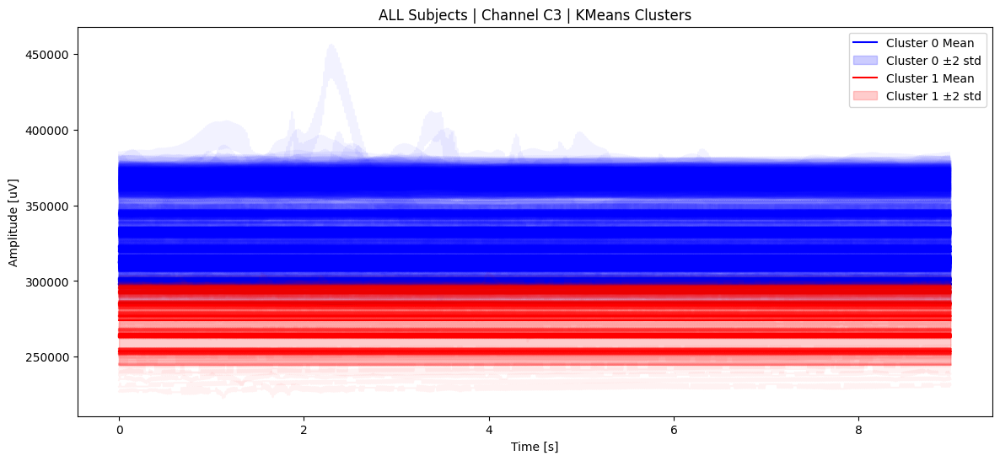

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.cluster import KMeans

# --- Config ---
base_path = '/kaggle/input/mtcaic3'
task = 'MI'
dataset = 'train'
channel = 'C3'  # or 'C4'
n_clusters = 2  # or more

# Load metadata
train_df = pd.read_csv(os.path.join(base_path, 'train.csv'))
all_subjects = train_df['subject_id'].unique()
print("Subjects found:", all_subjects)

# Collect signals for ALL subjects, given channel
signals = []

for subject in all_subjects:
    subject_trials = train_df[
        (train_df['subject_id'] == subject) &
        (train_df['task'] == task)
    ]

    for _, row in subject_trials.iterrows():
        eeg_file = f"{base_path}/{row['task']}/{dataset}/{row['subject_id']}/{row['trial_session']}/EEGdata.csv"
        eeg_data = pd.read_csv(eeg_file)
        samples_per_trial = 2250  # MI
        idx = int(row['trial']) - 1
        trial_data = eeg_data.iloc[idx*samples_per_trial : (idx+1)*samples_per_trial]
        signal = trial_data[[channel]].values.squeeze()
        signals.append(signal)

signals = np.stack(signals)
print(f"Collected {signals.shape[0]} trials, each with {signals.shape[1]} samples.")

# --- Clustering all trials ---
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(signals)

# --- Plot ---
time = np.arange(signals.shape[1]) / 250  # seconds

plt.figure(figsize=(14, 6))

colors = ['blue', 'red', 'green', 'orange', 'purple']

for cluster_id in range(n_clusters):
    cluster_signals = signals[cluster_labels == cluster_id]
    mean_signal = np.mean(cluster_signals, axis=0)
    std_signal = np.std(cluster_signals, axis=0)

    upper = mean_signal + 2 * std_signal
    lower = mean_signal - 2 * std_signal

    plt.plot(time, mean_signal, label=f'Cluster {cluster_id} Mean', color=colors[cluster_id])
    plt.fill_between(time, lower, upper, color=colors[cluster_id], alpha=0.2, label=f'Cluster {cluster_id} ±2 std')

    # Optional: plot all raw signals for this cluster (faint)
    for signal in cluster_signals:
        plt.plot(time, signal, color=colors[cluster_id], alpha=0.05)

plt.title(f'ALL Subjects | Channel {channel} | KMeans Clusters')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude [uV]')
plt.legend()
plt.show()


Subjects found: ['S1' 'S2' 'S3' 'S4' 'S5' 'S6' 'S7' 'S8' 'S9' 'S10' 'S11' 'S12' 'S13'
 'S14' 'S15' 'S16' 'S17' 'S18' 'S19' 'S20' 'S21' 'S22' 'S23' 'S24' 'S25'
 'S26' 'S27' 'S28' 'S29' 'S30']
Collected 2400 trials, each with 2250 samples.


/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


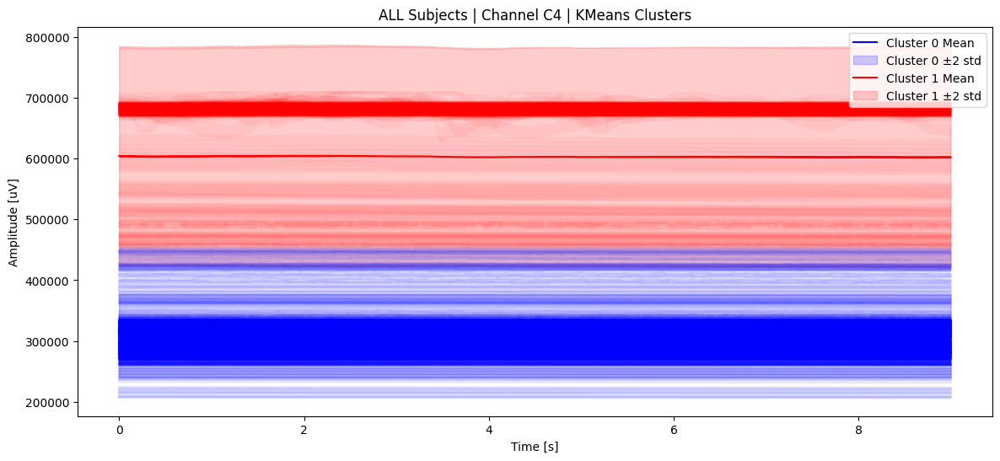

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.cluster import KMeans

# --- Config ---
base_path = '/kaggle/input/mtcaic3'
task = 'MI'
dataset = 'train'
channel = 'C4'  # or 'C4'
n_clusters = 2  # or more

# Load metadata
train_df = pd.read_csv(os.path.join(base_path, 'train.csv'))
all_subjects = train_df['subject_id'].unique()
print("Subjects found:", all_subjects)

# Collect signals for ALL subjects, given channel
signals = []

for subject in all_subjects:
    subject_trials = train_df[
        (train_df['subject_id'] == subject) &
        (train_df['task'] == task)
    ]

    for _, row in subject_trials.iterrows():
        eeg_file = f"{base_path}/{row['task']}/{dataset}/{row['subject_id']}/{row['trial_session']}/EEGdata.csv"
        eeg_data = pd.read_csv(eeg_file)
        samples_per_trial = 2250  # MI
        idx = int(row['trial']) - 1
        trial_data = eeg_data.iloc[idx*samples_per_trial : (idx+1)*samples_per_trial]
        signal = trial_data[[channel]].values.squeeze()
        signals.append(signal)

signals = np.stack(signals)
print(f"Collected {signals.shape[0]} trials, each with {signals.shape[1]} samples.")

# --- Clustering all trials ---
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(signals)

# --- Plot ---
time = np.arange(signals.shape[1]) / 250  # seconds

plt.figure(figsize=(14, 6))

colors = ['blue', 'red', 'green', 'orange', 'purple']

for cluster_id in range(n_clusters):
    cluster_signals = signals[cluster_labels == cluster_id]
    mean_signal = np.mean(cluster_signals, axis=0)
    std_signal = np.std(cluster_signals, axis=0)

    upper = mean_signal + 2 * std_signal
    lower = mean_signal - 2 * std_signal

    plt.plot(time, mean_signal, label=f'Cluster {cluster_id} Mean', color=colors[cluster_id])
    plt.fill_between(time, lower, upper, color=colors[cluster_id], alpha=0.2, label=f'Cluster {cluster_id} ±2 std')

    # Optional: plot all raw signals for this cluster (faint)
    for signal in cluster_signals:
        plt.plot(time, signal, color=colors[cluster_id], alpha=0.05)

plt.title(f'ALL Subjects | Channel {channel} | KMeans Clusters')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude [uV]')
plt.legend()
plt.show()
